In [64]:
import pandas as pd
from sklearn.preprocessing import PowerTransformer
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [85]:
ruta='../data/processed/df_max.xlsx'

In [65]:
ruta='../data/processed/df_mean.xlsx'

In [86]:
intact = pd.read_excel(ruta)     

In [87]:
intact

,origin_db,subject,stimulus,Channel 1_VAR_STD,Channel 2_VAR_STD,Channel 3_VAR_STD,Channel 4_VAR_STD,Channel 5_VAR_STD,Channel 6_VAR_STD,Channel 7_VAR_STD,...,Channel 7_MNF,Channel 8_MNF,Channel 1_SSC,Channel 2_SSC,Channel 3_SSC,Channel 4_SSC,Channel 5_SSC,Channel 6_SSC,Channel 7_SSC,Channel 8_SSC
0,NinaProDB1,1,22,1.556622,8.491342,4.807763,0.657234,0.052948,0.126834,6.225271,...,216.338318,153.986437,139.166667,118.000000,143.750000,92.916667,93.333333,97.500000,158.416667,161.583333
1,NinaProDB1,1,25,2.335566,1.654429,2.529078,1.077355,0.065492,0.079775,14.299958,...,196.925029,153.904745,137.333333,93.000000,124.750000,111.333333,81.166667,89.000000,163.166667,168.916667
2,NinaProDB1,1,27,5.408909,3.989522,8.206502,0.474338,0.058332,0.503866,8.516195,...,208.520234,150.899472,145.916667,133.916667,142.500000,98.000000,97.083333,107.833333,157.500000,151.916667
3,NinaProDB1,1,30,18.827876,35.048381,17.412131,3.460524,0.128043,0.105301,15.995140,...,206.973507,148.802810,151.416667,122.916667,140.083333,91.833333,112.083333,101.500000,168.666667,158.916667
4,NinaProDB1,1,31,0.186208,1.404981,6.669579,0.207704,0.078409,0.018098,1.257786,...,170.885424,135.944500,117.416667,102.916667,126.833333,68.416667,104.166667,84.250000,146.916667,161.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
604,NinaProDB5,10,27,5319.329445,13839.804221,4415.694488,838.070796,3446.883784,629.798115,3791.475654,...,1631.565499,1790.451730,850.916667,862.000000,802.916667,750.500000,759.333333,704.333333,796.583333,873.083333
605,NinaProDB5,10,30,5539.788481,7460.248673,1692.826468,1477.550290,4009.287573,576.094752,4899.331778,...,1638.375115,1715.757938,818.166667,796.916667,755.000000,741.583333,744.833333,693.666667,759.416667,846.250000
606,NinaProDB5,10,31,4866.422511,3110.162110,499.535195,401.863167,773.270529,206.696111,556.803403,...,1522.542268,1687.353893,832.750000,751.583333,711.666667,708.583333,723.416667,677.083333,736.500000,827.666667
607,NinaProDB5,10,37,9077.967993,11582.342134,887.275336,1017.972728,1593.046177,1190.567329,7435.456604,...,1648.110260,1692.080245,826.083333,828.166667,742.583333,744.500000,754.000000,692.083333,785.166667,806.166667


In [88]:
features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
signal_cols = [f'Channel {ch}_{feat}' for ch in range(1, 9) for feat in features]

In [89]:
def boxcox_normalize_corrected(df_raw, signal_cols):
    df = df_raw.copy()
 
    for col in signal_cols:
        # MEJORA 1: Shift más robusto. 
        # En lugar de 1e-6, usamos un porcentaje del rango o un valor 
        # que no comprima la distribución hacia el cero absoluto.
        min_val = df[col].min()
        if min_val <= 0:
            # Sumamos un valor que mueva los datos fuera del 0 
            # sin volverlos insignificantes.
            df[col] = df[col] - min_val + 1.0 
 
    # MEJORA 2: standardize=True (CRÍTICO)
    # Esto aplica un Z-score (media=0, var=1) DESPUÉS de la transformación.
    # Evita que las escalas masivas de 'Energy' dominen sobre 'SSC'.
    transformer = PowerTransformer(method='box-cox', standardize=False)
    df[signal_cols] = transformer.fit_transform(df[signal_cols])
 
    return df

In [90]:
def yeojohnson_normalize(df_raw, signal_cols):

    df = df_raw.copy()
 
    transformer = PowerTransformer(method='yeo-johnson', standardize=False)
    df[signal_cols] = transformer.fit_transform(df[signal_cols])
 
    return df

In [91]:
df_boxcox_intact = boxcox_normalize_corrected(intact, signal_cols)
df_yeojohnson_intact = yeojohnson_normalize(intact, signal_cols)

In [92]:
df_boxcox_intact.to_csv('../data/master/intact_boxcox.csv', index=False)
df_yeojohnson_intact.to_csv('../data/master/intact_yeojohnson.csv', index=False)

In [73]:
def plot_histograms_by_channel(df, title):
    features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    fig.suptitle(title, fontsize=16)
    for i, feat in enumerate(features):
        ax = axes[i // 4][i % 4]
        vals = df[[f'Channel {ch}_{feat}' for ch in range(1, 9)]].values.flatten()
        sns.histplot(vals, kde=True, ax=ax, bins='auto', color='steelblue')
        ax.set_title(feat, fontsize=12)
        ax.set_xlabel('')
    plt.tight_layout()
    plt.show()

In [74]:
def get_features_summary_table(df):
    features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
    summary_data = []
    
    for feat in features:
        # 1. Extraer y aplanar los datos de los 8 canales para este feature
        # Esto es la misma lógica que usaste en plot_histograms_by_channel
        cols = [f'Channel {ch}_{feat}' for ch in range(1, 9)]
        
        # Verificamos que las columnas existan en el df para evitar errores
        cols_existing = [c for c in cols if c in df.columns]
        vals = df[cols_existing].values.flatten()
        
        # Limpiamos valores NaN para que no afecten los cálculos
        vals = vals[~np.isnan(vals)]
        
        # 2. Calcular estadísticas
        v_min = np.min(vals)
        v_max = np.max(vals)
        v_mean = np.mean(vals)
        v_std = np.std(vals)
        v_range = v_max - v_min
        
        summary_data.append({
            'Característica': feat,
            'Mín': v_min,
            'Máx': v_max,
            'Rango': v_range,
            'Media': v_mean,
            'Desv. Est.': v_std
        })
    
    # 3. Crear DataFrame y renombrar columnas
    df_summary = pd.DataFrame(summary_data)

    return df_summary

In [75]:
## 7. Distribución por estímulo
def plot_kde_by_channel(df, feature, title):
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    fig.suptitle(f'{title} — {feature}', fontsize=16)

    for ch in range(1, 9):
        ax = axes[(ch - 1) // 4][(ch - 1) % 4]
        col = f'Channel {ch}_{feature}'
        df_plot = df[['stimulus']].copy()
        df_plot['value'] = df[col].values
        
        sns.kdeplot(data=df_plot, x='value', hue='stimulus', 
                    ax=ax, palette='Set2', fill=False, linewidth=2)
        ax.set_title(f'Channel {ch}', fontsize=12)
        ax.set_xlabel('')
        ax.set_ylabel('')

    plt.tight_layout()
    plt.show()

# Intact

## Original

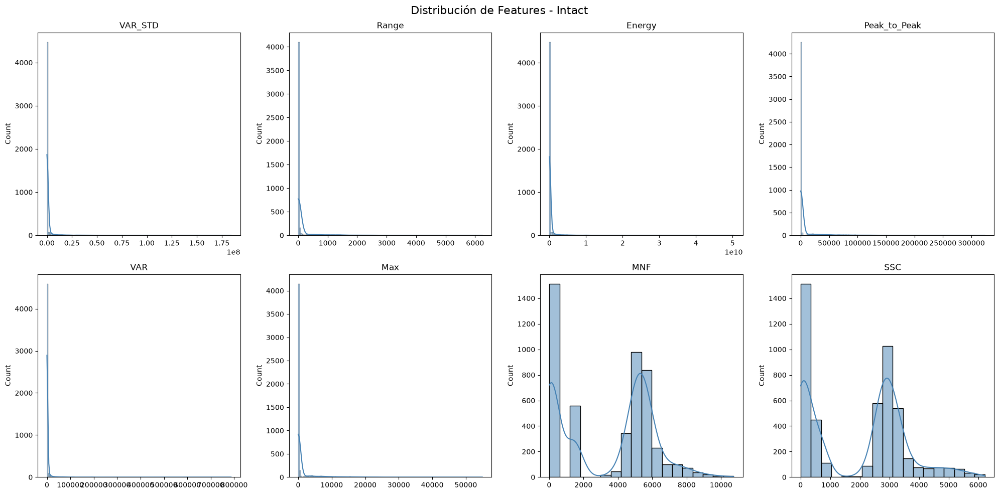

In [76]:
plot_histograms_by_channel(intact, 'Distribución de Features - Intact')

In [77]:
get_features_summary_table(intact)

,Característica,Mín,Máx,Rango,Media,Desv. Est.
0,VAR_STD,9.215463e-13,1.843106e+08,1.843106e+08,1.160633e+06,6.877980e+06
1,Range,1.705805e-07,6.245798e+03,6.245798e+03,1.456229e+02,5.367199e+02
2,Energy,3.905583e-10,5.027625e+10,5.027625e+10,3.158692e+08,1.923976e+09
3,Peak_to_Peak,2.413344e-05,3.236009e+05,3.236009e+05,6.189232e+03,2.208226e+04
4,VAR,1.700206e-16,7.868598e+05,7.868598e+05,2.565901e+03,1.926715e+04
5,Max,5.096995e-06,5.492410e+04,5.492410e+04,1.128219e+03,3.945085e+03
6,MNF,1.545479e+01,1.072557e+04,1.071011e+04,3.413466e+03,2.670338e+03
7,SSC,2.158333e+00,6.222375e+03,6.220217e+03,1.947521e+03,1.594757e+03


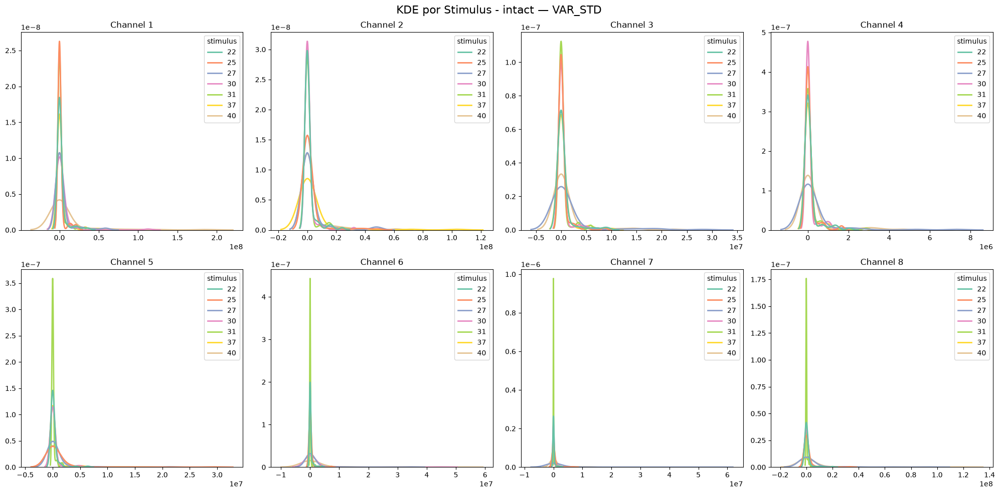

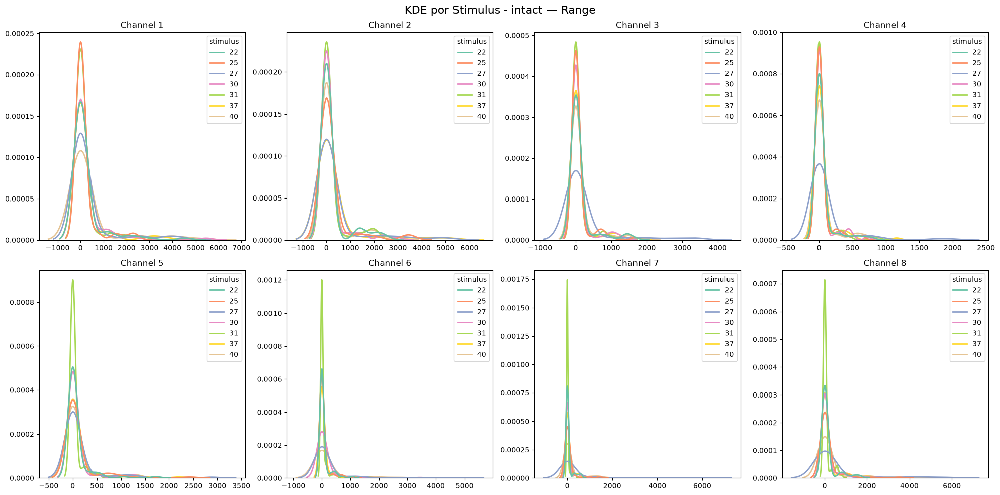

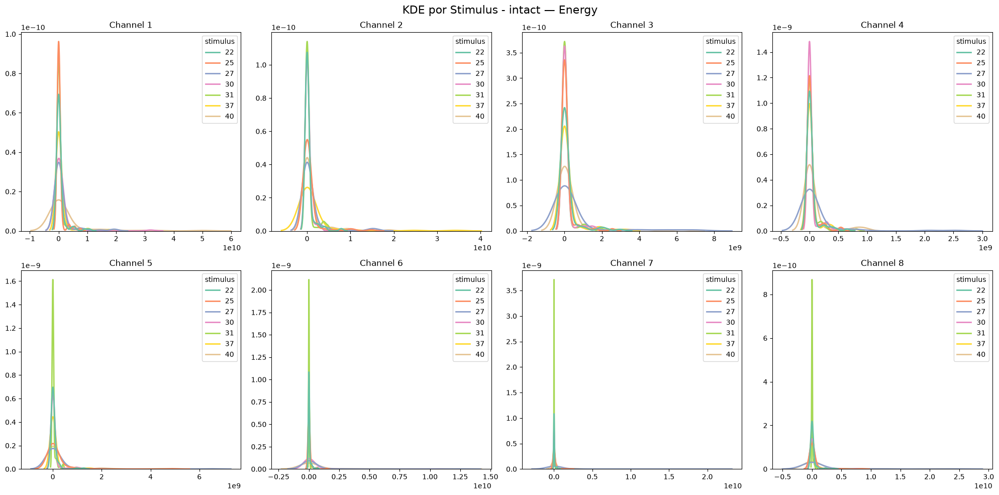

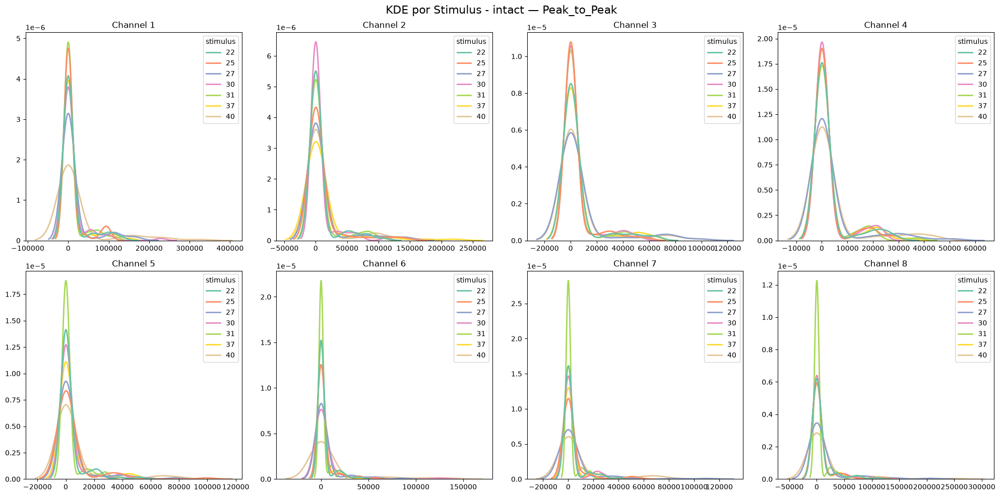

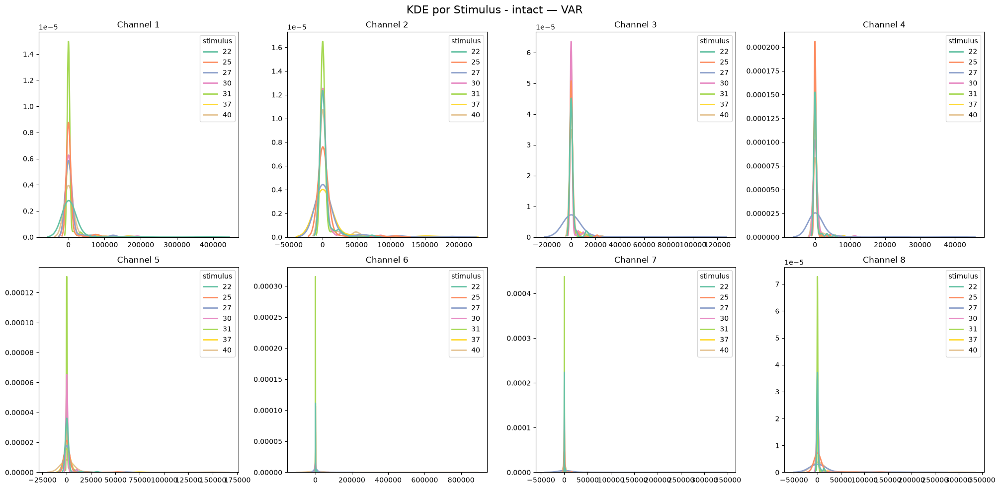

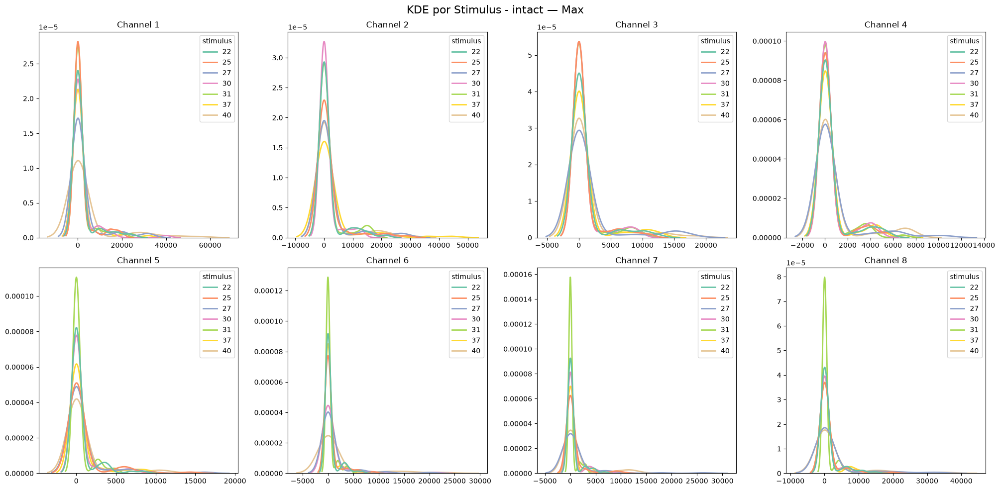

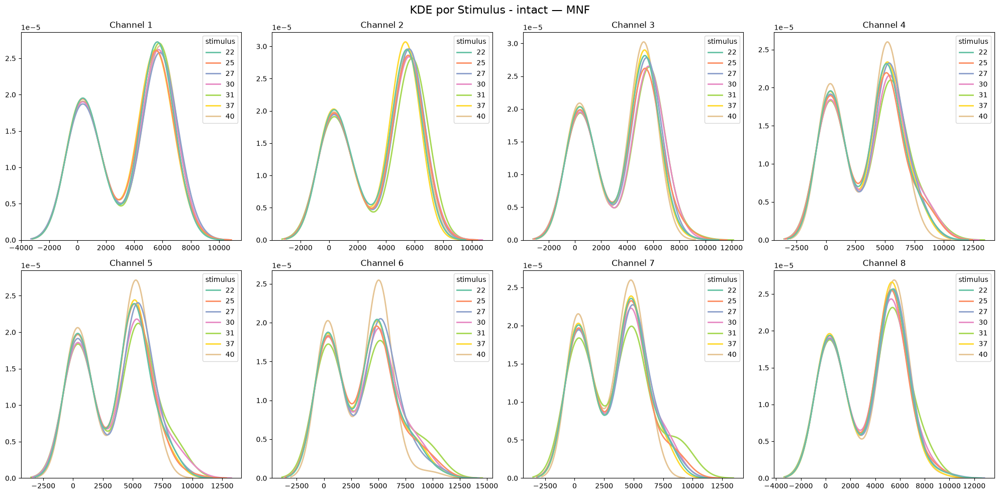

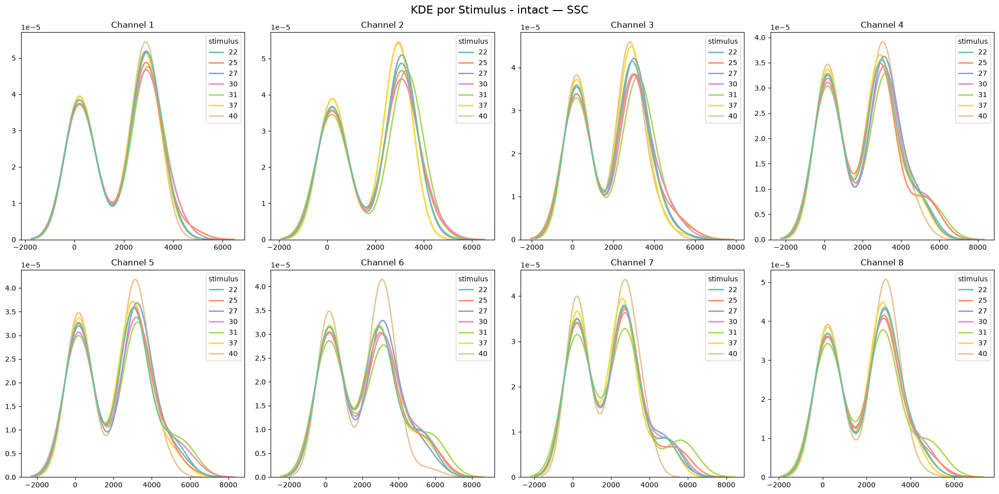

In [78]:
features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
for feat in features:
        plot_kde_by_channel(intact, feat, f'KDE por Stimulus - intact')

## Box-cox Transformation

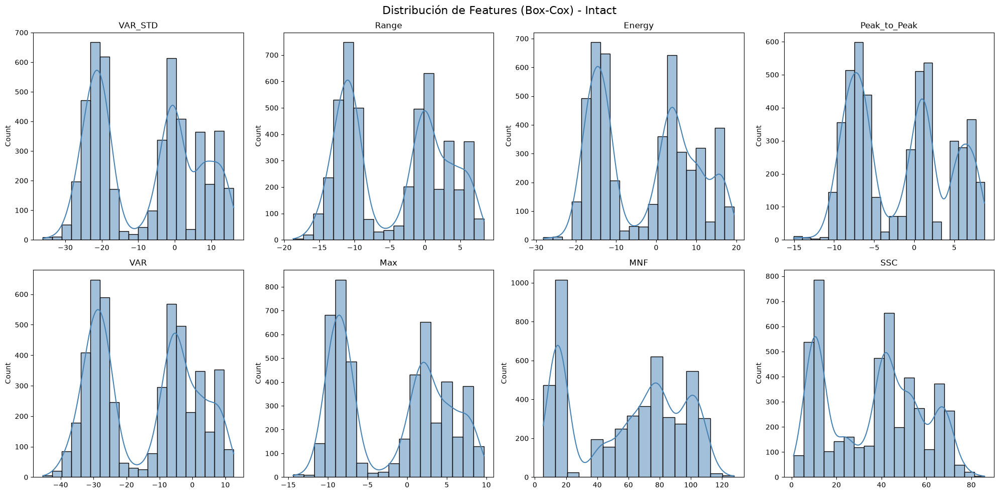

In [79]:
plot_histograms_by_channel(df_boxcox_intact, 'Distribución de Features (Box-Cox) - Intact')

In [80]:
get_features_summary_table(df_boxcox_intact)

,Característica,Mín,Máx,Rango,Media,Desv. Est.
0,VAR_STD,-36.171784,16.139764,52.311547,-8.048577,13.678554
1,Range,-18.731923,8.367449,27.099373,-4.277289,6.953409
2,Energy,-28.166424,19.465007,47.631431,-2.736373,11.943903
3,Peak_to_Peak,-15.060408,8.766165,23.826573,-1.728328,5.830748
4,VAR,-45.390525,12.538596,57.929121,-14.307432,14.856484
5,Max,-14.399567,9.694652,24.094219,-1.939741,6.527333
6,MNF,5.397295,127.813417,122.416122,59.174267,34.140550
7,SSC,0.901859,85.856967,84.955108,36.608224,21.105358


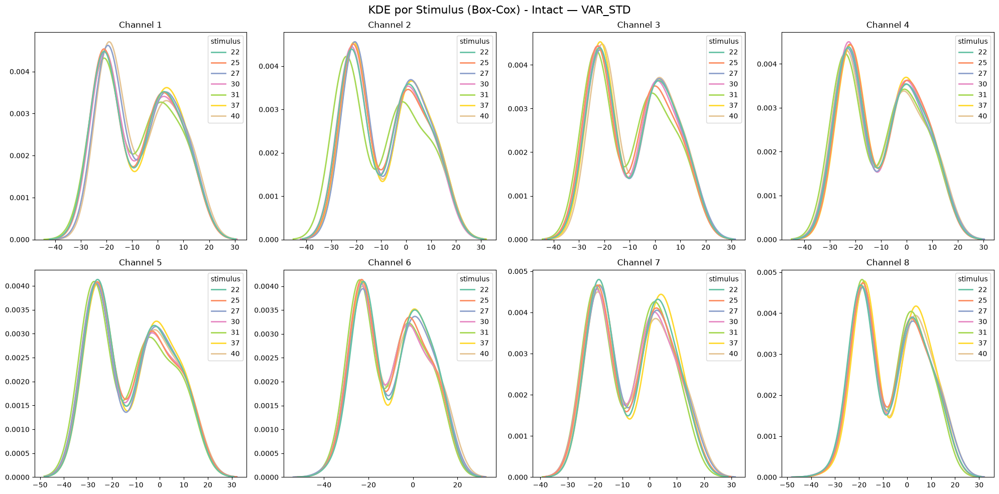

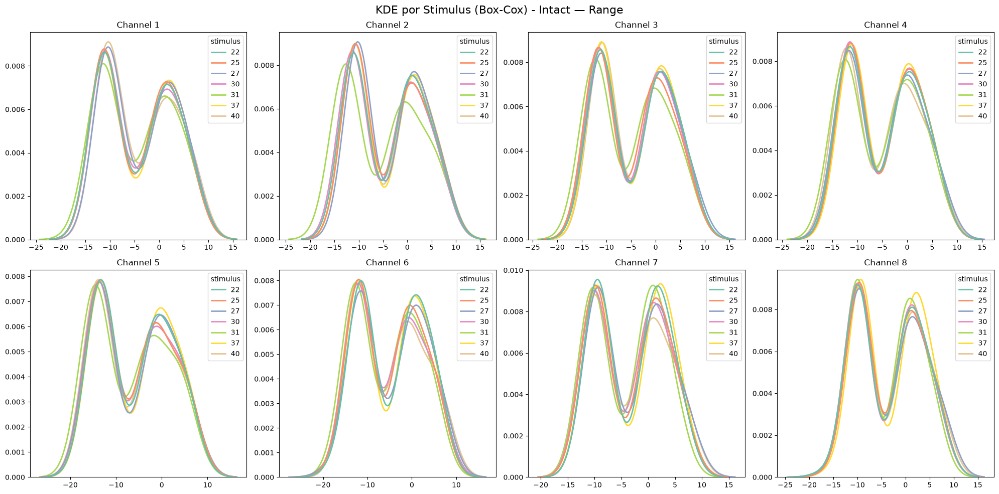

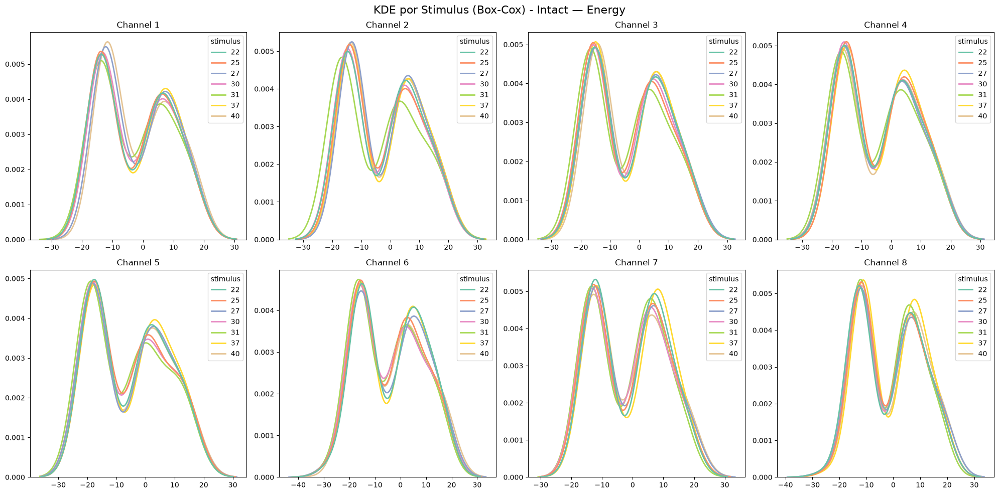

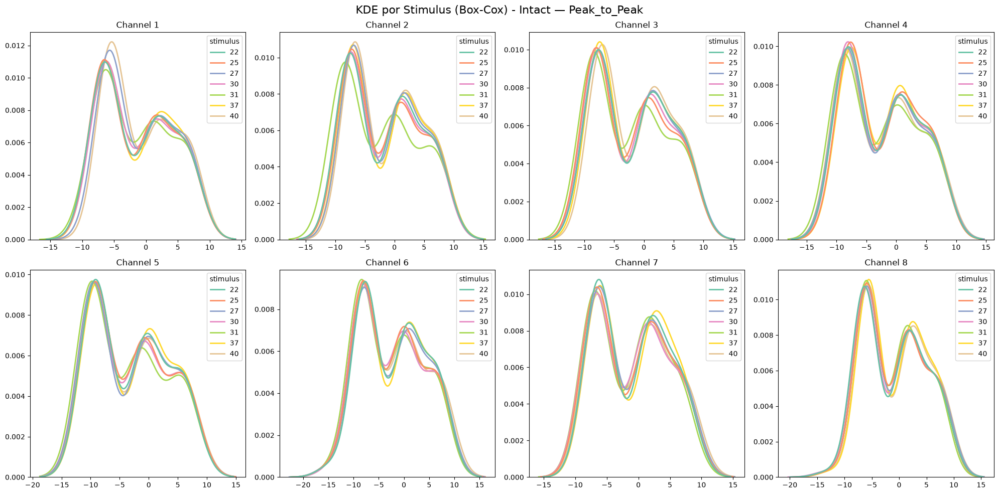

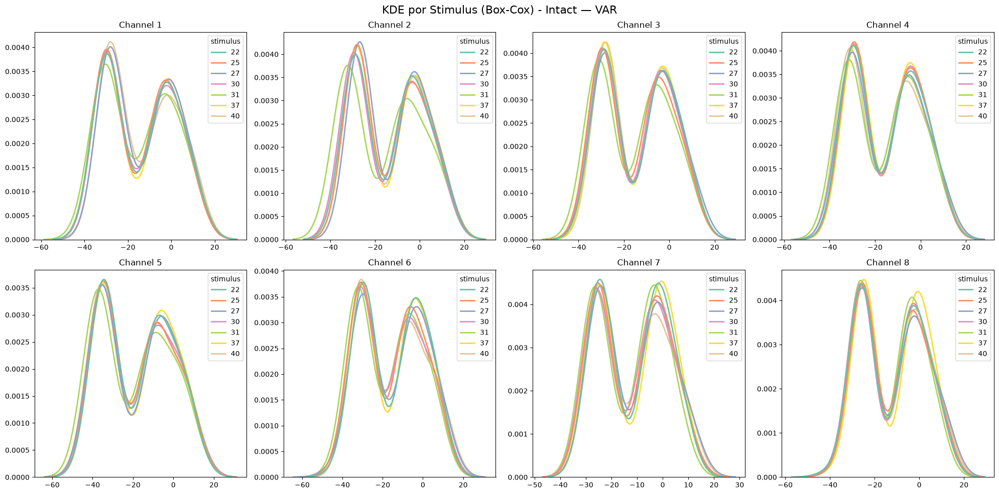

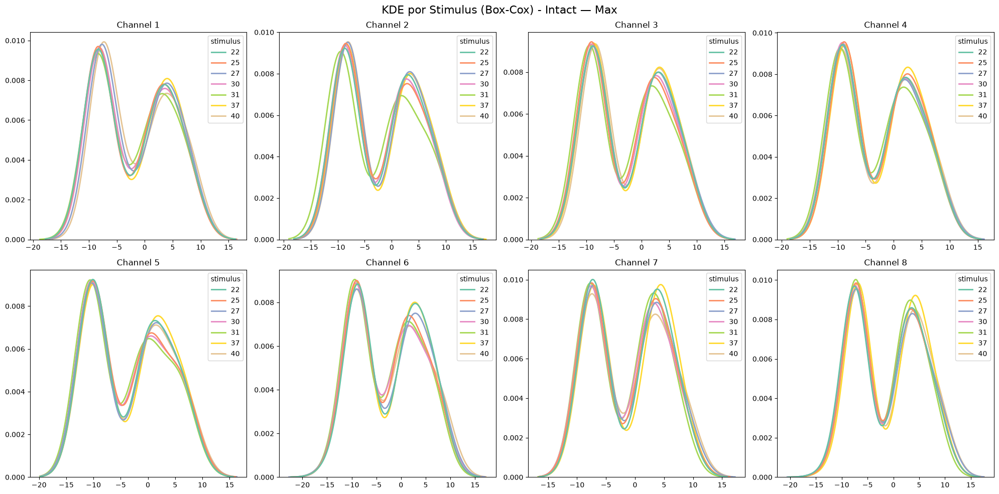

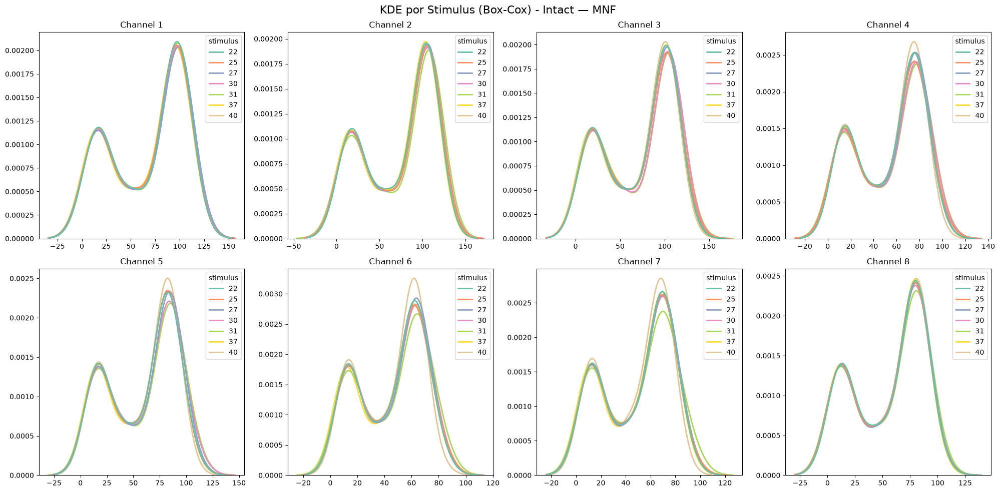

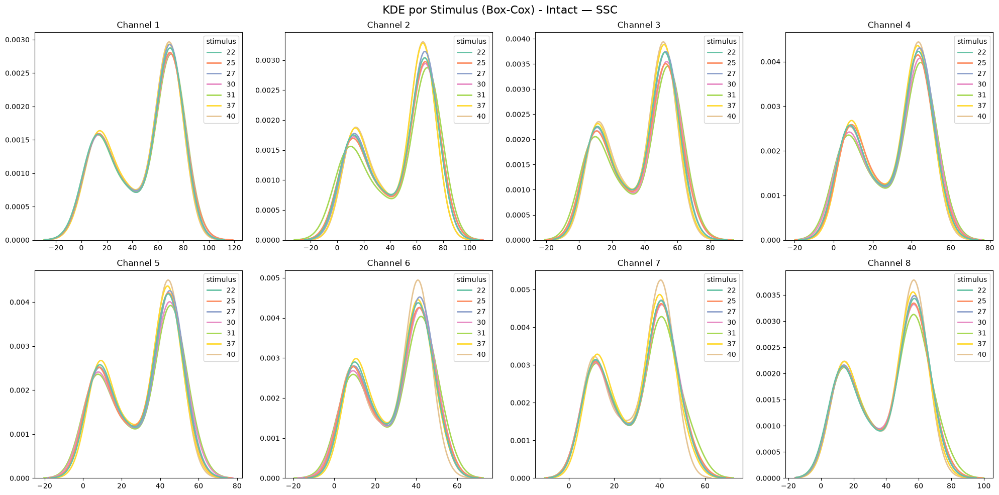

In [81]:
features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
for feat in features:
        plot_kde_by_channel(df_boxcox_intact, feat, f'KDE por Stimulus (Box-Cox) - Intact')

## Yeo-Johnson Transformation

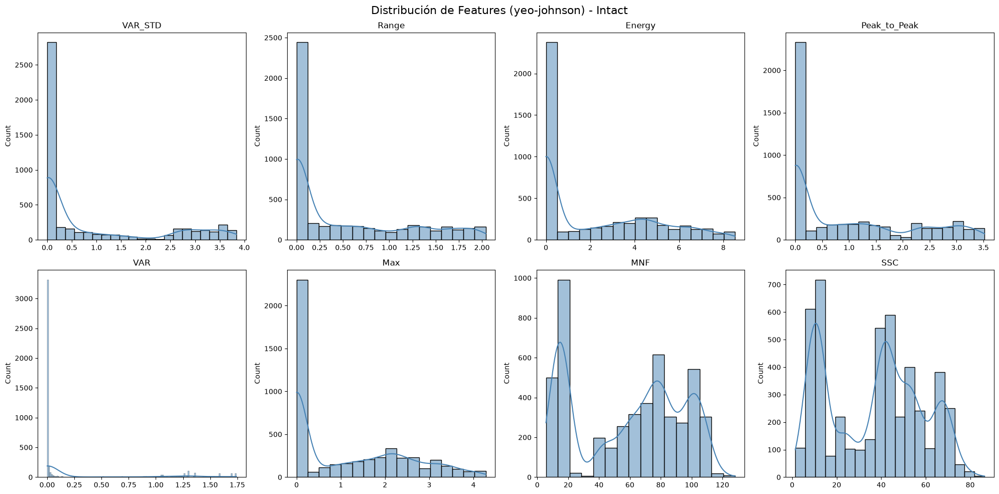

In [82]:
plot_histograms_by_channel(df_yeojohnson_intact, 'Distribución de Features (yeo-johnson) - Intact')

In [83]:
get_features_summary_table(df_yeojohnson_intact)

,Característica,Mín,Máx,Rango,Media,Desv. Est.
0,VAR_STD,9.215463e-13,3.839327,3.839327,0.900979,1.316147
1,Range,1.705804e-07,2.041219,2.041218,0.519423,0.657404
2,Energy,3.905583e-10,8.531422,8.531422,2.264438,2.613393
3,Peak_to_Peak,2.413304e-05,3.520321,3.520297,0.960831,1.149667
4,VAR,1.700206e-16,1.741622,1.741622,0.281063,0.533298
5,Max,5.096978e-06,4.279190,4.279185,1.150997,1.283680
6,MNF,5.621434e+00,128.244431,122.622997,59.373927,34.246716
7,SSC,1.421145e+00,86.428877,85.007731,36.760517,21.187765


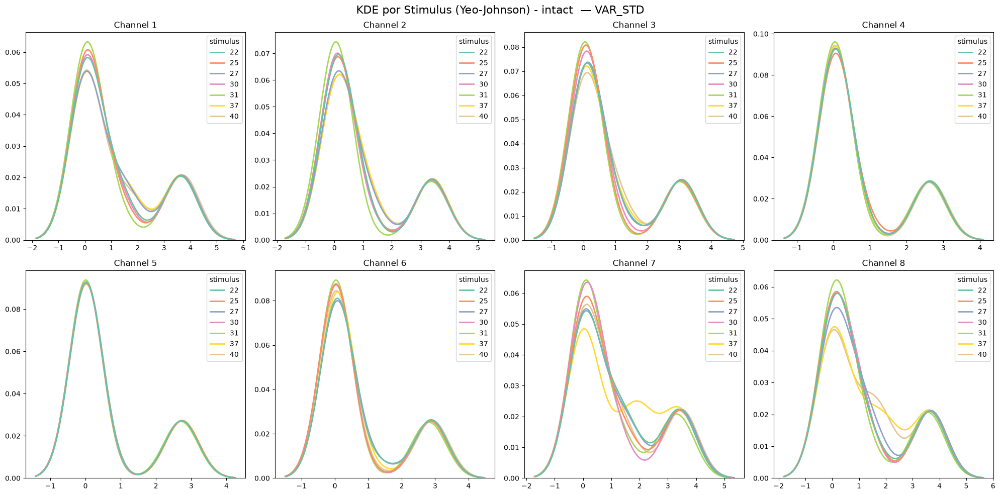

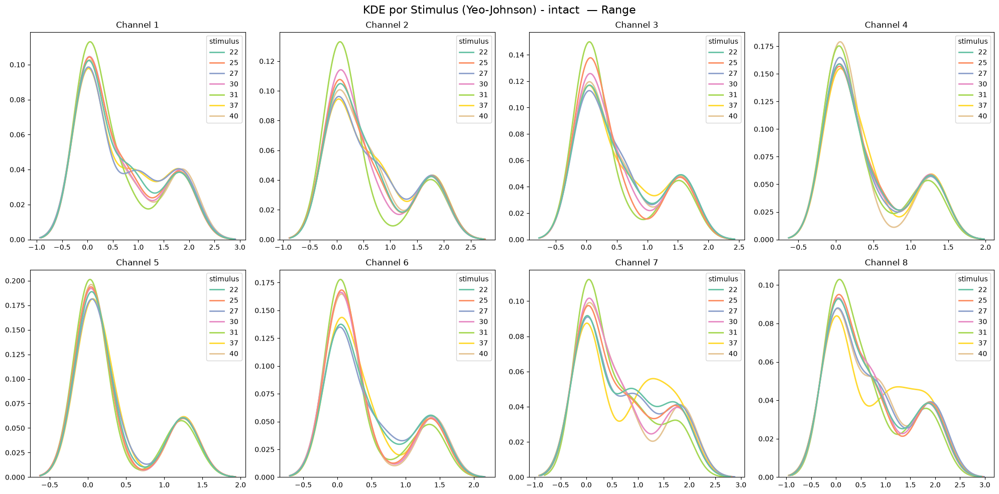

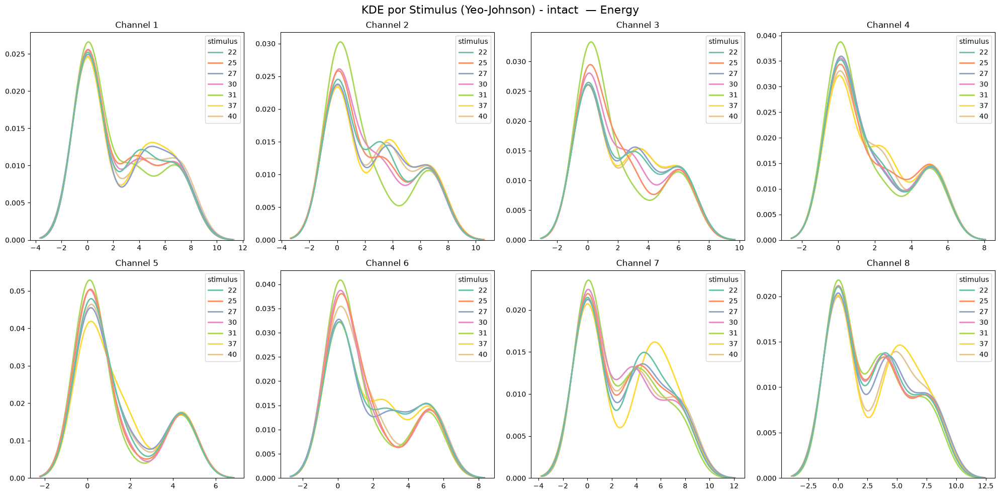

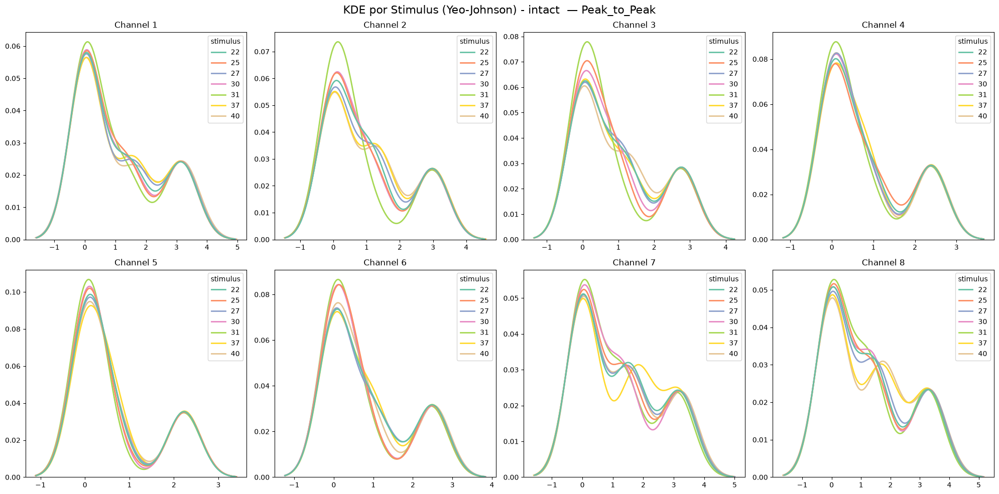

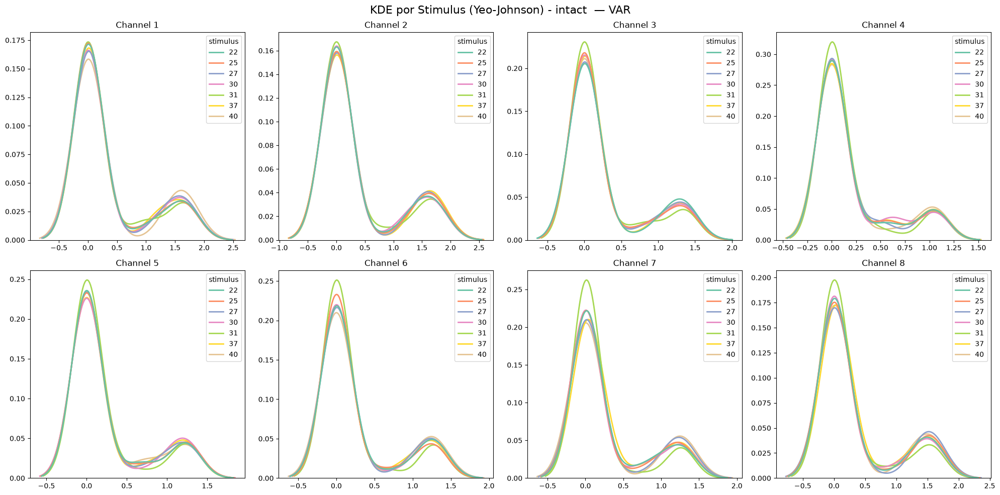

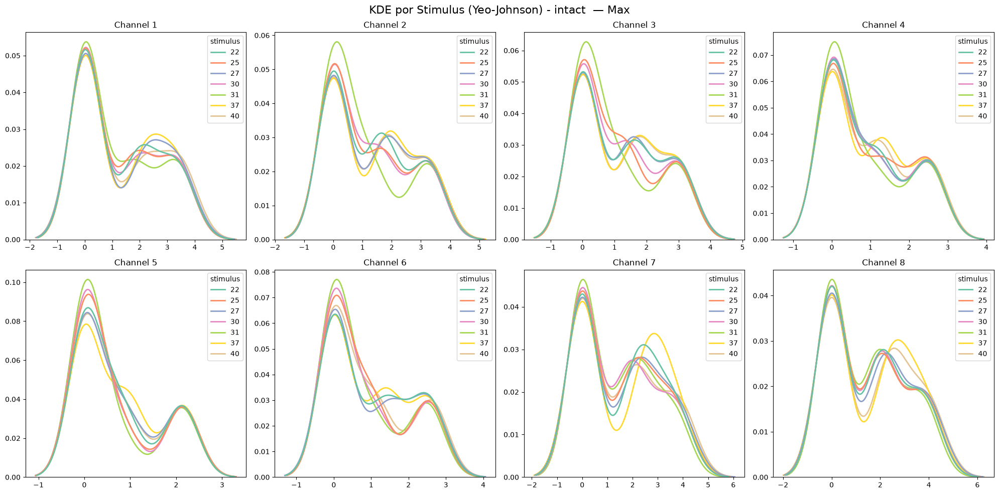

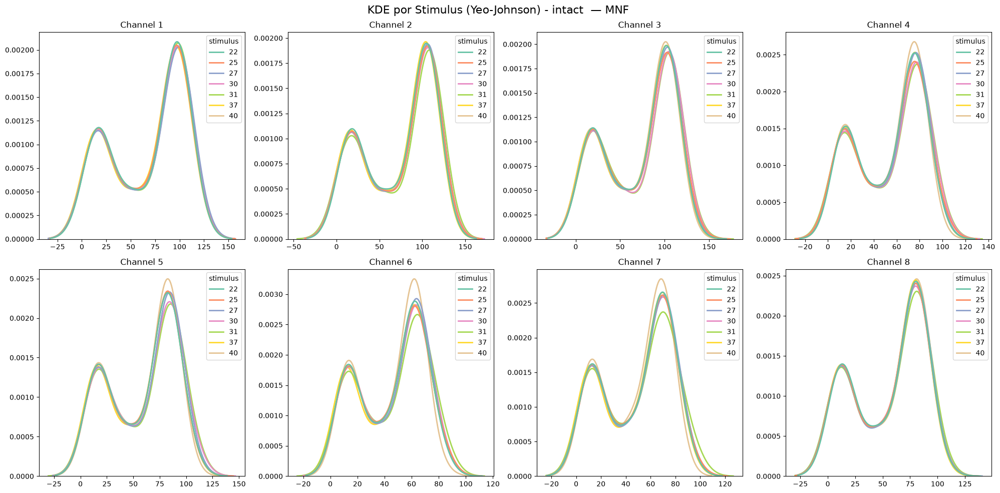

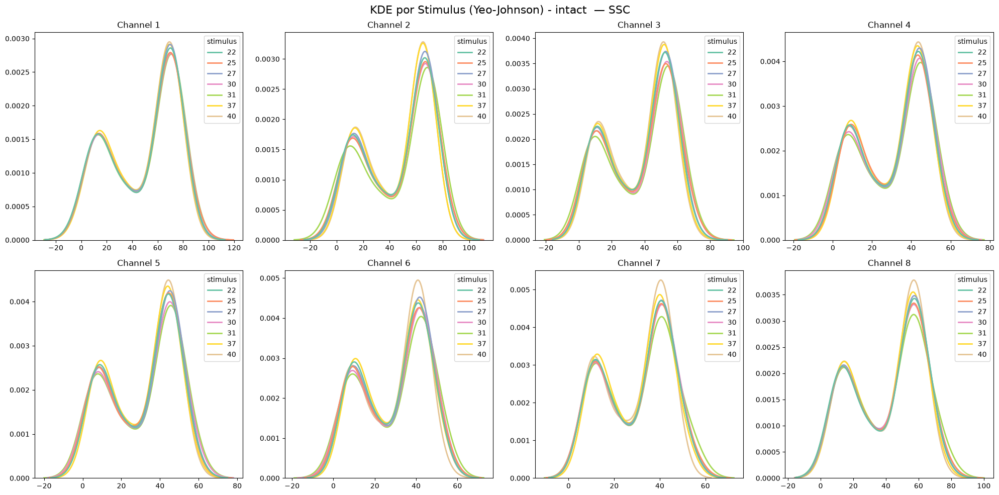

In [84]:
features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
for feat in features:
        plot_kde_by_channel(df_yeojohnson_intact, feat, f'KDE por Stimulus (Yeo-Johnson) - intact ')